# Midterm Presentation: Cooling Resources Team
### We have compiled our current working code using FEMA Vulnerability, Cooling Centers, Tree Canopy, and Census Tract information.

## LA case study:  Hot-spots in FEMA Vulnerability Index
#### I am specifically interested in understanding FEMA Vulnerability Index, specifically Heat Wave Vulnerability. To analyze extreme heat vulnerability, we will utilize FEMA's National Risk Index (NRI) for heat waves, which assesses relative risk by incorporating exposure, expected annual loss, and social vulnerability metrics. The first step in this process involves mapping the spatial distribution of heat-vulnerable areas across the selected region. This analysis will help identify communities most at risk and guide resource allocation, including cooling centers and mitigation projects. 
 In this notebook, I created a chloropleth map and chart. I am currently trouble shooting how to create a centroid given the shapefile and for loops.

In [37]:
# to read and wrangle data
import pandas as pd

# to create spatial data
import geopandas as gpd

# for basemaps
import contextily as ctx

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

#for distance calculations 
from shapely.geometry import Point
import numpy as np

In [2]:
import os
print(os.getcwd())

/home/jovyan/221finalproject


In [3]:
print(os.listdir())

['groupassignments', 'Zix', 'MidtermCompilation.ipynb', 'data', 'newcenters.ipynb', '.git', '.ipynb_checkpoints', '221 Mini Group Assignment - Google Docs.pdf', 'newheat.ipynb', 'updated project proposal.md']


In [4]:
# load a data file
# note the relative filepath! where is this file located?
df = pd.read_csv('data/NRI_Table_CensusTracts_California.csv')

In [5]:
#View Data
df.head()

,TRACT,TRACTFIPS,HWAV_EVNTS,HWAV_RISKV,HWAV_RISKS,HWAV_RISKR
0,400100,6001400100,24.333178,2647.154385,30.986301,Relatively Low
1,400200,6001400200,8.000000,1042.514215,22.122200,Relatively Low
2,400300,6001400300,8.000000,3421.489650,34.336203,Relatively Low
3,400400,6001400400,8.000000,2137.494980,28.594872,Relatively Low
4,400500,6001400500,8.000000,1854.243158,27.161918,Relatively Low


In [6]:
# Add FIPS column
df['FIPS'] = '06' + '037' + df['TRACT'].astype(str)

In [7]:
# View FIPS column
df['FIPS'] = df['FIPS'].astype(str)
df.head()

,TRACT,TRACTFIPS,HWAV_EVNTS,HWAV_RISKV,HWAV_RISKS,HWAV_RISKR,FIPS
0,400100,6001400100,24.333178,2647.154385,30.986301,Relatively Low,06037400100
1,400200,6001400200,8.000000,1042.514215,22.122200,Relatively Low,06037400200
2,400300,6001400300,8.000000,3421.489650,34.336203,Relatively Low,06037400300
3,400400,6001400400,8.000000,2137.494980,28.594872,Relatively Low,06037400400
4,400500,6001400500,8.000000,1854.243158,27.161918,Relatively Low,06037400500


In [8]:
import geopandas as gpd

In [9]:
# read in a geojson file downloaded from the LA Times
tracts=gpd.read_file('data/2020_Census_Tracts_new.geojson')
tracts.head()

,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry
0,4992,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.29793 34.26323, -118.30082 34.2..."
1,4993,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.27743 34.25991, -118.27743 34.2..."
2,4994,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.27818 34.25577, -118.27887 34.2..."
3,4995,101221,1012.21,3.812000e+06,9161.710543,"POLYGON ((-118.28735 34.25591, -118.28863 34.2..."
4,4996,101222,1012.22,3.191371e+06,9980.600461,"POLYGON ((-118.28594 34.2559, -118.28697 34.25..."


<Axes: >

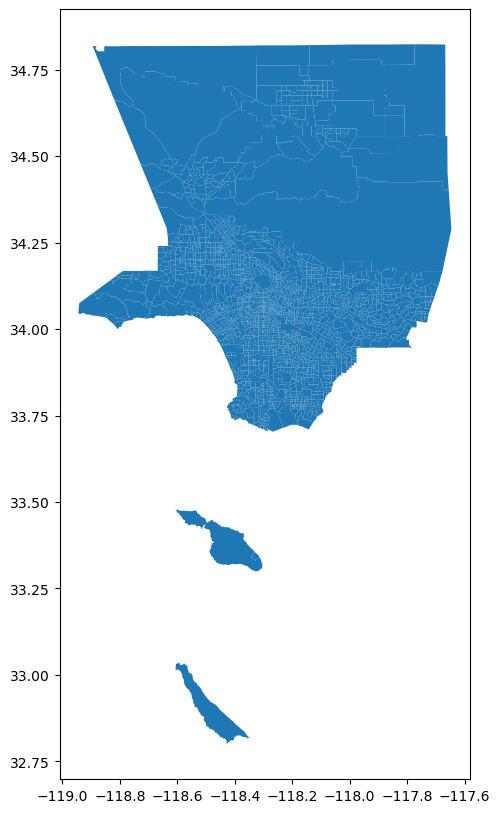

In [10]:
# plot it!
tracts.plot(figsize=(12,10))

In [11]:
# we only really need FIPS and geometry, so let's subset the data
tracts = tracts[['CT20','geometry']]
tracts.head()

,CT20,geometry
0,101110,"POLYGON ((-118.29793 34.26323, -118.30082 34.2..."
1,101122,"POLYGON ((-118.27743 34.25991, -118.27743 34.2..."
2,101220,"POLYGON ((-118.27818 34.25577, -118.27887 34.2..."
3,101221,"POLYGON ((-118.28735 34.25591, -118.28863 34.2..."
4,101222,"POLYGON ((-118.28594 34.2559, -118.28697 34.25..."


In [12]:
# create a FIPS column
tracts['FIPS'] ='06' + '037' + tracts['CT20']

/opt/conda/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [13]:
# check it!
tracts.head()

,CT20,geometry,FIPS
0,101110,"POLYGON ((-118.29793 34.26323, -118.30082 34.2...",06037101110
1,101122,"POLYGON ((-118.27743 34.25991, -118.27743 34.2...",06037101122
2,101220,"POLYGON ((-118.27818 34.25577, -118.27887 34.2...",06037101220
3,101221,"POLYGON ((-118.28735 34.25591, -118.28863 34.2...",06037101221
4,101222,"POLYGON ((-118.28594 34.2559, -118.28697 34.25...",06037101222


In [14]:
# Ensuring FIPS is a string
tracts['FIPS'] = tracts['FIPS'].astype(str)
tracts.head()

/opt/conda/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,CT20,geometry,FIPS
0,101110,"POLYGON ((-118.29793 34.26323, -118.30082 34.2...",06037101110
1,101122,"POLYGON ((-118.27743 34.25991, -118.27743 34.2...",06037101122
2,101220,"POLYGON ((-118.27818 34.25577, -118.27887 34.2...",06037101220
3,101221,"POLYGON ((-118.28735 34.25591, -118.28863 34.2...",06037101221
4,101222,"POLYGON ((-118.28594 34.2559, -118.28697 34.25...",06037101222


In [15]:
# Merge data
heat = tracts.merge(df, on="FIPS")
heat.head()

,CT20,geometry,FIPS,TRACT,TRACTFIPS,HWAV_EVNTS,HWAV_RISKV,HWAV_RISKS,HWAV_RISKR
0,101110,"POLYGON ((-118.29793 34.26323, -118.30082 34.2...",06037101110,101110,6037101110,79.987853,6451.720938,43.973267,Relatively Low
1,101122,"POLYGON ((-118.27743 34.25991, -118.27743 34.2...",06037101122,101122,6037101122,85.035807,3394.886179,34.239880,Relatively Low
2,101220,"POLYGON ((-118.27818 34.25577, -118.27887 34.2...",06037101220,101220,6037101220,82.982682,4577.152952,38.557770,Relatively Low
3,101221,"POLYGON ((-118.28735 34.25591, -118.28863 34.2...",06037101221,101221,6037101221,78.000000,5157.533315,40.336774,Relatively Low
4,101222,"POLYGON ((-118.28594 34.2559, -118.28697 34.25...",06037101222,101222,6037101222,78.000000,4322.069956,37.661133,Relatively Low


In [16]:
# Right CRS
heat.crs = "EPSG:4326"

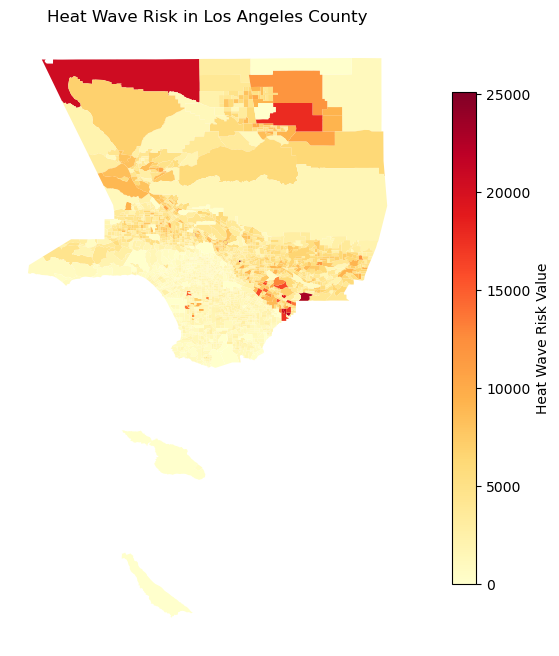

In [17]:
fig, ax = plt.subplots(figsize=(12, 8))

heat.plot(column='HWAV_RISKV',
         cmap='YlOrRd',
         legend=True,
         legend_kwds={'label': 'Heat Wave Risk Value', 'shrink': 0.8},
         ax=ax,
         aspect='equal')

ax.set_title('Heat Wave Risk in Los Angeles County')
ax.axis('off')
plt.show()

In [18]:
high_risk_areas = heat.sort_values('HWAV_RISKV', ascending=False)
print(high_risk_areas)

        CT20                                           geometry         FIPS  \
555   201200  POLYGON ((-118.17177 34.08905, -118.17207 34.0...  06037201200   
1620  500100  POLYGON ((-117.94225 33.97476, -117.9433 33.97...  06037500100   
1165  311000  POLYGON ((-118.33827 34.18987, -118.3383 34.18...  06037311000   
1700  503802  POLYGON ((-117.99438 33.9027, -117.99503 33.90...  06037503802   
1117  301000  POLYGON ((-118.22476 34.16428, -118.2249 34.16...  06037301000   
...      ...                                                ...          ...   
1051  277400  POLYGON ((-118.37007 33.95268, -118.37059 33.9...  06037277400   
2525  980012  POLYGON ((-118.1542 33.92907, -118.155 33.9294...  06037980012   
2542  980037  POLYGON ((-118.27553 33.80787, -118.27562 33.8...  06037980037   
2532  980020  POLYGON ((-118.27249 34.23253, -118.27369 34.2...  06037980020   
2516  980003  POLYGON ((-117.88062 34.76362, -117.86261 34.7...  06037980003   

       TRACT   TRACTFIPS  HWAV_EVNTS   

In [19]:
high_risk_areas.head(10)

,CT20,geometry,FIPS,TRACT,TRACTFIPS,HWAV_EVNTS,HWAV_RISKV,HWAV_RISKS,HWAV_RISKR
555,201200,"POLYGON ((-118.17177 34.08905, -118.17207 34.0...",06037201200,201200,6055201200,17.129783,25147.64795,70.139847,Relatively Moderate
1620,500100,"POLYGON ((-117.94225 33.97476, -117.9433 33.97...",06037500100,500100,6085500100,25.000000,23004.57381,68.358465,Relatively Moderate
1165,311000,"POLYGON ((-118.33827 34.18987, -118.3383 34.18...",06037311000,311000,6013311000,30.000000,22722.43804,68.095657,Relatively Moderate
1700,503802,"POLYGON ((-117.99438 33.9027, -117.99503 33.90...",06037503802,503802,6085503802,25.000000,22370.93633,67.773391,Relatively Moderate
1117,301000,"POLYGON ((-118.22476 34.16428, -118.2249 34.16...",06037301000,301000,6013301000,30.127363,21618.49401,67.111021,Relatively Moderate
1705,504001,"POLYGON ((-118.0118 33.91712, -118.01194 33.91...",06037504001,504001,6085504001,25.000000,21143.92004,66.628217,Relatively Moderate
2400,901209,"POLYGON ((-118.32629 34.81973, -118.32632 34.8...",06037901209,901209,6037901209,84.062954,20601.51657,66.121629,Relatively Moderate
1707,504002,"POLYGON ((-118.01931 33.90056, -118.01924 33.9...",06037504002,504002,6085504002,25.000000,19961.06023,65.484232,Relatively Moderate
1650,501700,"POLYGON ((-118.02517 33.9674, -118.02525 33.96...",06037501700,501700,6085501700,25.000000,18834.82055,64.258193,Relatively Moderate
2454,911100,"POLYGON ((-117.88071 34.61672, -117.88082 34.6...",06037911100,911100,6037911100,80.000000,17796.67609,63.057128,Relatively Moderate


In [20]:
top_10_fips = high_risk_areas.head(10)['FIPS'].tolist()
top_10_tracts = heat[heat['FIPS'].isin(top_10_fips)].copy()
top_10_tracts.head(10)

,CT20,geometry,FIPS,TRACT,TRACTFIPS,HWAV_EVNTS,HWAV_RISKV,HWAV_RISKS,HWAV_RISKR
554,201200,"POLYGON ((-118.17177 34.08905, -118.17207 34.0...",06037201200,201200,6037201200,74.000000,2411.901338,29.936260,Relatively Low
555,201200,"POLYGON ((-118.17177 34.08905, -118.17207 34.0...",06037201200,201200,6055201200,17.129783,25147.647950,70.139847,Relatively Moderate
1117,301000,"POLYGON ((-118.22476 34.16428, -118.2249 34.16...",06037301000,301000,6013301000,30.127363,21618.494010,67.111021,Relatively Moderate
1118,301000,"POLYGON ((-118.22476 34.16428, -118.2249 34.16...",06037301000,301000,6037301000,78.000000,5976.989762,42.690149,Relatively Low
1165,311000,"POLYGON ((-118.33827 34.18987, -118.3383 34.18...",06037311000,311000,6013311000,30.000000,22722.438040,68.095657,Relatively Moderate
1166,311000,"POLYGON ((-118.33827 34.18987, -118.3383 34.18...",06037311000,311000,6037311000,78.000000,3842.623959,35.942777,Relatively Low
1619,500100,"POLYGON ((-117.94225 33.97476, -117.9433 33.97...",06037500100,500100,6037500100,73.523029,2723.937834,31.312134,Relatively Low
1620,500100,"POLYGON ((-117.94225 33.97476, -117.9433 33.97...",06037500100,500100,6085500100,25.000000,23004.573810,68.358465,Relatively Moderate
1649,501700,"POLYGON ((-118.02517 33.9674, -118.02525 33.96...",06037501700,501700,6037501700,74.000000,3867.951536,36.037911,Relatively Low
1650,501700,"POLYGON ((-118.02517 33.9674, -118.02525 33.96...",06037501700,501700,6085501700,25.000000,18834.820550,64.258193,Relatively Moderate


In [21]:
import matplotlib.pyplot as plt
import geopandas as gpd
from adjustText import adjust_text

fig, ax = plt.subplots(figsize=(12, 8))

top_10_tracts.plot(column='HWAV_RISKV',
         cmap='YlOrRd',
         legend=True,
         legend_kwds={'label': 'Heat Wave Risk Value', 'shrink': 0.8},
         ax=ax,
         aspect='equal')
# Add labels to the top 10 tracts, using adjustText to prevent overlap
texts = []
for idx, row in top_10_tracts.iterrows():
    centroid = row['geometry'].centroid
    text = ax.annotate(text=row['CT20'], xy=(centroid.x, centroid.y),
                       horizontalalignment='center', fontsize=8, color='black')
    texts.append(text)

adjust_text(texts, ax=ax, autoalign='xy',
            force_points=0.8, force_text=0.8,
            expand_points=(2, 2), expand_text=(1, 1),
            arrowprops=dict(arrowstyle="-", color='black', lw=0.5))

# Add a title
ax.set_title('Top 10 Census Tracts with Highest Heat Wave Risk in Los Angeles County')

# Remove the axes
ax.axis('off')

plt.show()

ModuleNotFoundError: No module named 'adjustText'

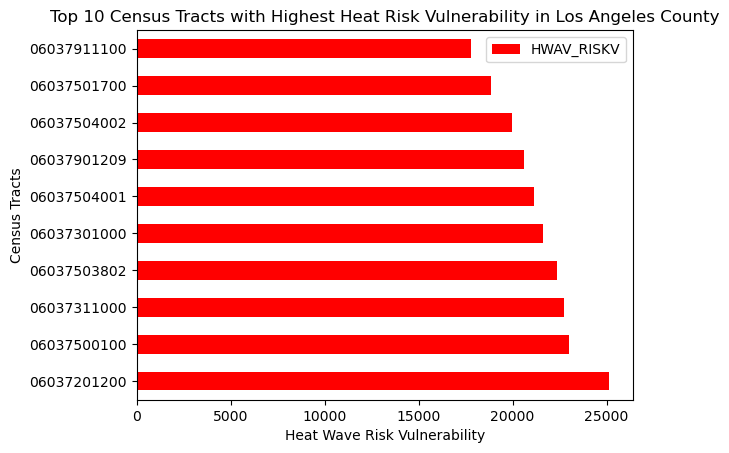

In [22]:
# Create the bar plot
ax = high_risk_areas.head(10).plot.barh(x='FIPS',
                            y='HWAV_RISKV',
                            color='red')

# Set the title and labels AFTER creating the plot
plt.title('Top 10 Census Tracts with Highest Heat Risk Vulnerability in Los Angeles County')
plt.xlabel('Heat Wave Risk Vulnerability') # Set x-axis label
plt.ylabel('Census Tracts') # Set y-axis label
plt.savefig('Top_10_Census_Tracts_Heat_Risk.jpg')

In [23]:
import folium

In [24]:
import folium
import geopandas as gpd
import json

# Assuming 'heat' is your GeoDataFrame after the merge, with a valid CRS

## 1. Define the center of your map (Los Angeles)
la_latitude = 34.0522
la_longitude = -118.2437

# 2. Create a Folium map object
m_heat = folium.Map(location=[la_latitude, la_longitude],
               zoom_start=9,
               tiles='CartoDB positron',
               attribution='CartoDB')

# 3. Ensure your GeoDataFrame has a CRS (e.g., EPSG:4326) before converting
if heat.crs is None:
    heat.crs = "EPSG:4326"  # Or the appropriate CRS for your data
else:
    heat = heat.to_crs("EPSG:4326") # convert data

#Check the data type to ensure the data is compatible with the json format.
heat['HWAV_RISKV'] = heat['HWAV_RISKV'].astype(float)

# 4. Add the GeoJSON data to the map as a choropleth layer
folium.Choropleth(
    geo_data=heat.to_json(),  # Pass the GeoJSON string directly
    data=heat,          # Pass the GeoDataFrame itself
    key_on='feature.properties.FIPS',  # Key, or merge column
    columns=['FIPS', 'HWAV_RISKV'],  # [Key, value]
    fill_color='YlOrRd',
    line_weight=0.1,
    fill_opacity=0.8,
    line_opacity=0.2,  # Line opacity (of the border)
    legend_name='Heat Wave Risk Value'  # Name on the legend color bar
).add_to(m_heat)

# 5. Display the map
m_heat

## Cooling Center Data:

#### We will start our analysis by exploring the spatial distrubution of cooling centers across Los Angeles County. Cooling centers are air-conditioned libraries, senior and community centers, or parks that provide shelter for residents during extreme heat days. Site information of cooling centers are provided by [Ready LA](https://ready.lacounty.gov/heat/). To map out the centers, we will combine the site information with census tract information downloaded by the US Census Bureau. Mapping out these centers is the <b> first step </b> in drawing out spatial patters across social demographics in relation to cooling centers. 

#### Site information was downloaded as a CSV file from the Ready LA website, which provides Site Name, Address, and hours/days of operation. In order to acquire geographic location data of each site, the CSV was inputted into the [Census Bureau Public Geocoder](https://geocoding.geo.census.gov/geocoder/), which outputs a csv file of geographic location (latitude, longitude) and census tract information of an address by matching the inputted address (from Ready LA) to an address range. Of the 190 cooling center locations, 174 addresses received an address match, however there were 16 locations that did not received a match. For these no mathces, we manually inputted the coordinates of the nearest address to the cooling center based on Google Maps into the Geocoder to get approximate location details and manually added them to the outputted Geocoder results in an Excel sheet. There were initial issues with reading the CSV file, so the encoding code is set to "windows-1254".

In [25]:
#read into Cooling Center data downloaded from LA Ready 
centers = pd.read_csv("data/GeocodeResultsCleaned_CoolingCenters(Sheet0).csv", encoding='windows-1254')

In [26]:
#rename the longitude column, which was a following space attached to its name from the original download
centers = centers.rename(columns={'LONGITUDE ': 'LONGITUDE', 'INPUT ADDRESS ': 'Address', 'RECORD ID NUMBER' : 'Name'})

In [27]:
#convert all column names to lowercase 
centers.columns = centers.columns.str.lower()
centers.columns

Index(['name', 'address', 'tiger address range match indicator',
       'tiger match type', 'tiger output address', 'longitude', 'latitude',
       'tigerline id', 'tigerline id side', 'state code', 'county code',
       'tract code', 'block code'],
      dtype='object')

In [28]:
#convert the state, tract and county codes to a string in order to create a FIPs string
centers[['state code', 'tract code', 'county code']] = centers[['state code', 'tract code', 'county code']].astype(str)

In [29]:
#create a FIPS column, which will later be used to merge with the census tract data set 
centers['FIPS'] = '0' + centers['state code'] + centers['county code'] + centers['tract code']
centers['FIPS'].head()

0    0637106111
1    0637108102
2    0637311000
3    0637541100
4    0637540902
Name: FIPS, dtype: object

In [30]:
#split address by street, city, zip to extract city to understand which cities have higher concentrations of centers
centers[['street', 'city', 'zip']] = centers["address"].str.split(",", n=2, expand=True)
centers['city']

0             Sylmar
1       Porter Ranch
2            Burbank
3            Compton
4       Los Angeles 
           ...      
185      Los Angeles
186       Montebello
187             Bell
188     La Crescenta
189         Van Nuys
Name: city, Length: 190, dtype: object

In [31]:
#strip by trailing characters on the right side of the string
centers['city'] = centers['city'].str.rstrip()

In [32]:
# Indices of columns to drop
column_indices_to_drop = [2,3,4,7,8,9,10]

# Drop columns by index
centers = centers.drop(centers.columns[column_indices_to_drop], axis=1)

In [33]:
#create a geometry column to create a single geographic locaiton point using the provided longitude and latitude points
centers['geometry'] = gpd.points_from_xy(centers.longitude, centers.latitude)

In [34]:
#convert centers into a geopandas 
centers = gpd.GeoDataFrame(centers, 
                           crs='epsg: 4326', #second parameter is the crs code
                           geometry=centers['geometry']) #thrid parameter is geometry which needs to know which long/lat points to map to
centers.head()

,name,address,longitude,latitude,tract code,block code,FIPS,street,city,zip,geometry
0,Veteran's Memorial Community Regional Park,"13000 Sayre St, Sylmar, 91342",-118.417156,34.324843,106111,2003,0637106111,13000 Sayre St,Sylmar,91342,POINT (-118.41716 34.32484)
1,Porter Ranch Branch Library,"11371 Tampa Avenue, Porter Ranch, 91326",-118.558526,34.276780,108102,1000,0637108102,11371 Tampa Avenue,Porter Ranch,91326,POINT (-118.55853 34.27678)
2,Northwest Library,"3323 W. Victory Blvd., Burbank, 91505",-118.347214,34.184764,311000,3017,0637311000,3323 W. Victory Blvd.,Burbank,91505,POINT (-118.34721 34.18476)
3,Roy Campanella Park,"14812 S Stanford Ave, Compton, 90220",-118.261095,33.898681,541100,3001,0637541100,14812 S Stanford Ave,Compton,90220,POINT (-118.2611 33.89868)
4,A C Bilbrew Library,"150 E El Segundo Blvd , Los Angeles , 90061",-118.272094,33.916366,540902,3002,0637540902,150 E El Segundo Blvd,Los Angeles,90061,POINT (-118.27209 33.91637)


In [35]:
#find distance between centers by importing numpy 
def avg_dist(df):
    # List of points (replace with your full dataset)
    coords = [(point.x, point.y) for point in df.geometry]
    
    # Create a GeoDataFrame
    gdf = gpd.GeoDataFrame(geometry=[Point(x, y) for x, y in coords], crs="EPSG:4326") 
    
    # Reproject to a suitable CRS (EPSG:2229 for LA County in feet, EPSG:26945 for meters)
    gdf = gdf.to_crs(epsg=2229)  # Use 26945 if you prefer meters
    
    # Compute pairwise distance matrix
    dist_matrix = gdf.geometry.apply(lambda g: gdf.distance(g))
    
    # Extract upper triangle (excluding diagonal)
    distances = dist_matrix.to_numpy()
    upper_triangle = distances[np.triu_indices(len(gdf), k=1)]
    
    # Compute average distance
    average_distance_feet = round(upper_triangle.mean(), 2)
    average_distance_miles = round((average_distance_feet / 5280), 2)
    return average_distance_miles

In [38]:
avg_dist_LA_County = avg_dist(centers)
print("The average distance between centers in LA county is " + str(avg_dist_LA_County) + " miles.")

The average distance between centers in LA county is 20.3 miles.


In [39]:
#look specifically at centers in the city of LA 
LA_centers = centers[centers['city'] == ' Los Angeles']

In [40]:
avg_dist_LA_City = avg_dist(LA_centers)
print("The average distance between centers in the city of LA is " + str(avg_dist_LA_City) + " miles.")

The average distance between centers in the city of LA is 7.49 miles.


In [41]:
#read into the geojson file downloaded from the US Census Reporter  
tracts = gpd.read_file("data/acs2023_5yr_B01003_14000US06037575001.geojson")

In [42]:
# trim the data to the bare minimum columns
tracts = tracts[['geoid','B01003001','geometry']]

# rename the columns
tracts.columns = ['FIPS','TotalPop','geometry']
tracts['FIPS'] = tracts['FIPS'].str.replace('14000US06037','') #replace 15,000 US with nothing since every row has this US identifier in FIPS 
tracts.head()

,FIPS,TotalPop,geometry
0,05000US06037,9848406.0,"MULTIPOLYGON (((-118.6782 33.03973, -118.6756 ..."
1,101110,4152.0,"MULTIPOLYGON (((-118.30229 34.2587, -118.30091..."
2,101122,4198.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
3,101220,3434.0,"MULTIPOLYGON (((-118.28592 34.25404, -118.2859..."
4,101221,3931.0,"MULTIPOLYGON (((-118.29792 34.25597, -118.2969..."


In [43]:
# delete first row which is for the entire county of LA
tracts.drop(tracts.head(1).index,inplace=True) #1 is the first value of the tail and index resets the index

In [44]:
#subset data with pop less than 100 out of df 
tracts = tracts[tracts['TotalPop']>100]

In [45]:
tracts = tracts.to_crs(epsg=3857) #keep consistent projection 
centers = centers.to_crs(epsg=3857)

In [46]:
# get the bounding box coordinates for the centers data
minx, miny, maxx, maxy = centers.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-13224683.415738665
-13104123.360806333
3993459.184591898
4123719.9021027423


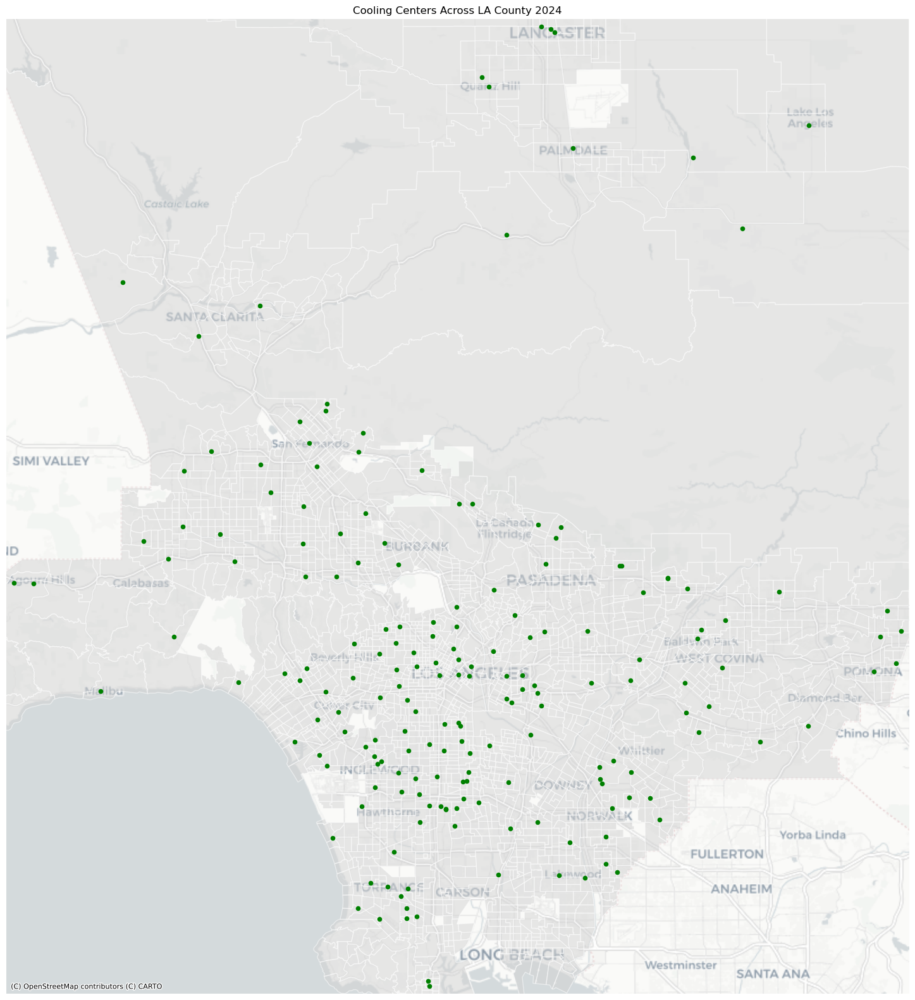

In [47]:
fig, ax = plt.subplots(figsize=(20, 20))

# plot tracts
tracts.plot(ax=ax, # this puts it in the ax plot
        color='lightgray', 
        edgecolor='white',
        alpha=0.5)

# add centers to the plot 
centers.plot(ax=ax, #plot it here in ax in the empty sublot 
        marker='o', #instead of default marker, mark with an X
        markersize=20,
        color='green')

# turn the axes off
ax.axis('off')

ax.set_title('Cooling Centers Across LA County 2024')

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx - 1000, maxx + 1000) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny - 1000, maxy + 1000)

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [48]:
totalTracts = len(tracts.FIPS)
totalCenters = len(centers["name"])

print("There are " + str(totalCenters) + " cooling centers across LA County.")

There are 190 cooling centers across LA County.


In [49]:
centerPerTract= totalCenters / totalTracts
centerPerTract

0.07698541329011345

In [50]:
centerPerTractPercent = round(centerPerTract * 100, 2)
print("" + str(centerPerTractPercent) + " of census tracts in LA County have a cooling center.")

7.7 of census tracts in LA County have a cooling center.


In [51]:
# count the number of centers per tract
centers_by_tract = centers.value_counts(centers['tract code']).reset_index(name='centers_count').sort_values(by='centers_count', ascending=False)
centers_by_tract['FIPS'] = centers_by_tract['tract code']
centers_by_tract

,tract code,centers_count,FIPS
0,104124,2,104124
1,106111,2,106111
2,228710,2,228710
3,535200,2,535200
4,540902,2,540902
...,...,...,...
174,911001,1,911001
175,911100,1,911100
176,920048,1,920048
177,920106,1,920106


In [52]:
tracts = pd.merge(tracts, centers_by_tract, on= 'FIPS', how='left')
#df = pd.merge(a, b, on='id', how='left')
tracts

,FIPS,TotalPop,geometry,tract code,centers_count
0,101110,4152.0,"MULTIPOLYGON (((-13169350.794 4063591.834, -13...",101110,1.0
1,101122,4198.0,"MULTIPOLYGON (((-13169467.902 4065613.937, -13...",NaN,NaN
2,101220,3434.0,"MULTIPOLYGON (((-13167528.828 4062965.287, -13...",NaN,NaN
3,101221,3931.0,"MULTIPOLYGON (((-13168864.105 4063224.413, -13...",NaN,NaN
4,101222,2572.0,"MULTIPOLYGON (((-13168465.581 4062734.852, -13...",NaN,NaN
...,...,...,...,...,...
2463,980024,205.0,"MULTIPOLYGON (((-13193418.068 4053521.172, -13...",NaN,NaN
2464,980025,442.0,"MULTIPOLYGON (((-13165155.719 4008337.305, -13...",NaN,NaN
2465,980031,970.0,"MULTIPOLYGON (((-13168099.229 3995788.284, -13...",NaN,NaN
2466,980035,642.0,"MULTIPOLYGON (((-13135477.609 4032787.081, -13...",NaN,NaN


In [53]:
tract_morethan1 = centers_by_tract[centers_by_tract['centers_count'] >= 2]
print("There are " + str(len(tract_morethan1)) + " census tracts with 2 or more centers.")

There are 11 census tracts with 2 or more centers.


In [54]:
tract_just1 = centers_by_tract[centers_by_tract['centers_count'] == 1]
print("There are " + str(len(tract_just1)) + " census tracts with only 1 center.")

There are 168 census tracts with only 1 center.


In [55]:
#count the number of centers per CITY 
centers_by_city = centers.value_counts('city').reset_index(name='count').sort_values(by='count', ascending=False)
city_morethan1 = centers_by_city[centers_by_city['count'] >= 2]
city_morethan1

,city,count
0,Los Angeles,64
1,Inglewood,6
2,Torrance,6
3,Sylmar,4
4,Compton,4
5,Whittier,4
6,Lancaster,3
7,Pomona,3
8,Altadena,3
9,Hacienda Heights,2


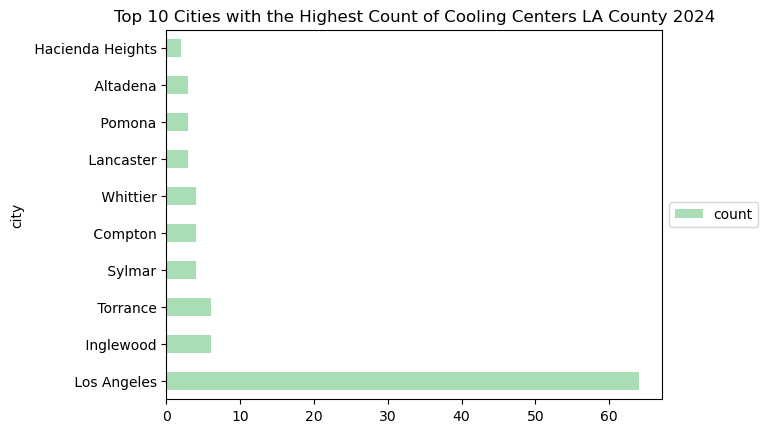

In [56]:
ax = city_morethan1.head(10).plot.barh(x='city',
                                   y='count',
                                   title= 'Top 10 Cities with the Highest Count of Cooling Centers LA County 2024',
                                   color = '#a8ddb5')

ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

ax.figure.savefig('top_10_cities_centers.png', bbox_inches='tight')

In [57]:
#calculate avg population 
TotalPop = sum(tracts.TotalPop)
totalTracts = len(tracts.FIPS)
peoplePerTract = TotalPop / totalTracts
peoplePerTract

3990.3164505672607

## Combining datasets

In [68]:
# 1 ensure tracts_heat same crs
tracts_heat = heat.to_crs(3857)

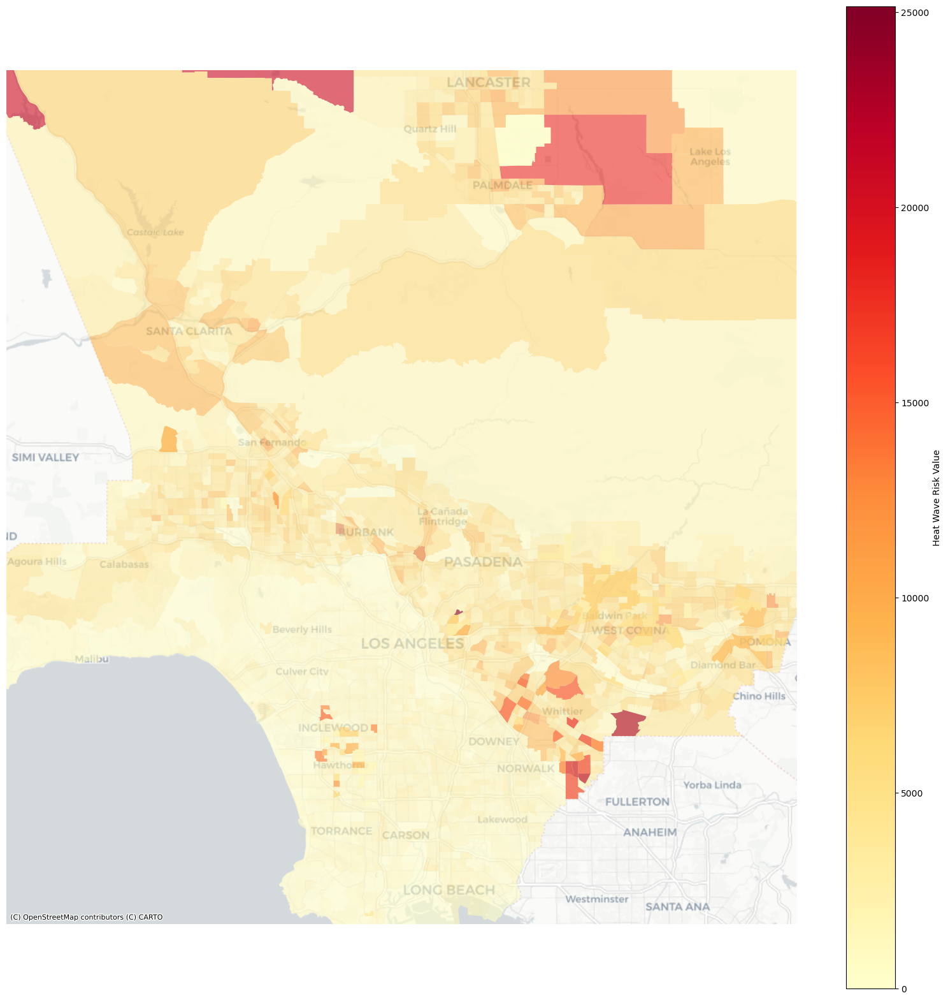

In [69]:
# --- 2. Start the combined plot ---
fig, ax = plt.subplots(figsize=(20, 20))

# --- 3. Add the Heat Vulnerability Map ---
tracts_heat.plot(column='HWAV_RISKV', cmap='YlOrRd', legend=True,
                 legend_kwds={'label': 'Heat Wave Risk Value'}, ax=ax, alpha=0.6) # Adjust alpha for transparency
# --- 4. Add the Cooling Centers ---
centers.plot(ax=ax,
             marker='X',
             markersize=10,
             color='green',
             label='Cooling Centers')  # Add a label for the legend

ax.axis('off')

# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx - 1000, maxx + 1000) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny - 1000, maxy + 1000)

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Now let's try to find the tracts that are farthest away from a cooling center 

for each census tract, calculate the nearest driving distance to a cooling center. 
Pull in driving distance from week 8 
run a for loop to calculate distance to closest center

put into a df, sort by the tracts that have to travel the farthest. ONLY focus on tracts where heat wave risk index is relatively moderate or ABOVE - we do not need to focus on low vulnerability tracts


In [65]:
# Ensure correct CRS
tracts_heat = tracts_heat.to_crs(epsg=3310)
centers = centers.to_crs(epsg=3310)

# --- Calculate Distances ---
# Create a merged GeoDataFrame for distance calculations
merged = gpd.GeoDataFrame(tracts_heat, geometry=tracts_heat.geometry)  # Use tracts_heat's geometry

# Reset indices to ensure alignment
merged = merged.reset_index(drop=True)
centers = centers.reset_index(drop=True)

# Compute pairwise distances
distance_matrix = merged.geometry.apply(lambda g: centers.geometry.distance(g))

# Calculate minimum distance to a cooling center for each tract
min_distances = distance_matrix.min(axis=1)

# Convert meters to miles
min_distances_miles = min_distances * 0.00062137

# Add distances to tracts_heat GeoDataFrame
tracts_heat['distance_to_center'] = min_distances_miles


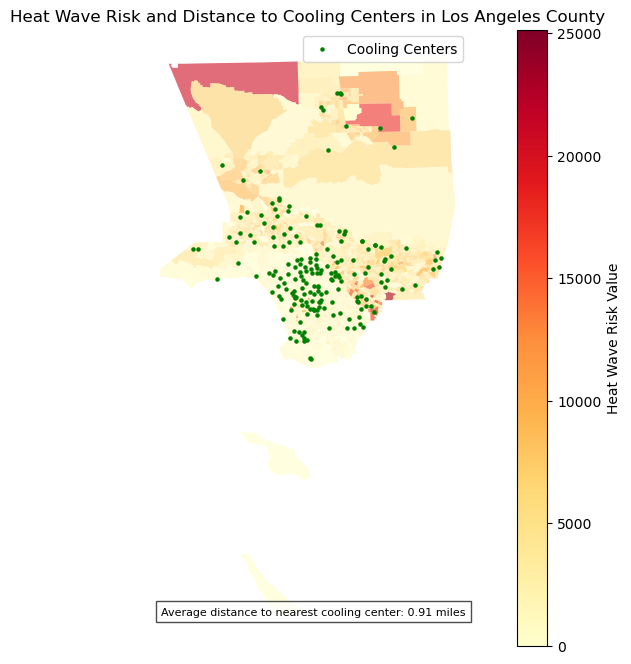

In [66]:
# --- Plotting ---
fig, ax = plt.subplots(figsize=(12, 8))

# Plot Heatwave Risk Map (same as before)
tracts_heat.plot(column='HWAV_RISKV', cmap='YlOrRd', legend=True,
                 legend_kwds={'label': 'Heat Wave Risk Value'}, ax=ax, alpha=0.6) # Adjust alpha for transparency

# Overlay Cooling Center Locations
centers.plot(ax=ax, color='green', markersize=5, label='Cooling Centers')

# Add labels and title
ax.set_title('Heat Wave Risk and Distance to Cooling Centers in Los Angeles County')
ax.set_axis_off()  # Turn off axis labels

# Add a text annotation for the average distance
average_distance_miles = round(tracts_heat['distance_to_center'].mean(), 2)
plt.annotate(f"Average distance to nearest cooling center: {average_distance_miles} miles",
             xy=(0.05, 0.05),  # Adjust position as needed
             xycoords='axes fraction',
             fontsize=8,
             bbox=dict(facecolor='white', alpha=0.7))  # Optional background

# Add legend
plt.legend()

# Show the plot
plt.show()

## Tree Canopy Data: 

#### Cailyn unable to merge notebook, will include separate link to her notebook while she troubleshoots JSON errors with TA/Chris. Error received when uploading her notebook: "Unreadable Notebook: /home/jovyan/up221-sienna/25W-groupproject/trees-Copy1.ipynb NotJSONError('Notebook does not appear to be JSON: \'{\\n "cells": [\\n {\\n "cell_type": "m...')"

In [ ]:
import pandas as pd

In [ ]:
import os
print(os.path.exists('data/treeppl5.csv'))

In [ ]:
print(os.getcwd())

In [ ]:
df = pd.read_csv('data/treeppl5.csv')

In [ ]:
# Convert Fips column into str
df= pd.read_csv('data/treeppl5.csv',
               dtype=
               {'Fips':str}
               )

In [ ]:
# keep only select columns (Educational attainment 25 yrs and older)
columns_to_keep = ['Fips', 
                   'City',
                   'treecanopy'
                   ]
#add it to a new dataframe
df2=df[columns_to_keep]

In [ ]:
# returns list to columns 
columns = list(df2) # this is the same as df.columns.to_list()
columns

In [ ]:
# Rename new columns 
df2.columns = ['Fips',
              'City', 
              'Tree Canopy Existing Percentage']

In [ ]:
# view median of new sample
df2['Tree Canopy Existing Percentage'].median()

In [ ]:
# look at all statistical measures of sample
df2['Tree Canopy Existing Percentage'].describe()

In [ ]:
# import coding libraries
import numpy as np
import io
import matplotlib.pyplot as plt
# to give more power to your figures (plots)
import matplotlib.pyplot as plt

In [ ]:
top_10_largest = df2.sort_values(by='Tree Canopy Existing Percentage', ascending=False).head(10)
print(top_10_largest)

In [ ]:
# import the themes
import plotly.io as pio

# import the themes
import plotly.io as pio

# for interactive plots 
import plotly.express as px

# list the templates available
pio.templates

In [ ]:
# set default template to plotly_white
pio.templates.default = "plotly_white"

In [ ]:
# bar chart
fig = px.bar(top_10_largest.head(10),
        x='Tree Canopy Existing Percentage',
        y='City',
        title="Top 10 Areas with Highest Tree Canopy in Los Angeles", # title
        text_auto = True,
        height=600,
        width=1000,
        color_discrete_sequence =['#B3DDCC']*len(top_10_largest), # single color for all the bars
        labels={
                'count': 'Number of buildngs',
                'building': 'Type of building',
        })

In [ ]:
# bar label
fig.update_traces(textposition='outside',textfont_size=12,textfont_color='#444')

# axes labels
fig.update_yaxes(title_font_size=14,title_font_color='#aaa',tickfont_color='#aaa',tickfont_size=12)
fig.update_xaxes(title_font_size=12,title_font_color='#aaa',tickfont_color='#aaa',tickfont_size=12)

# show the figure
fig.show()

In [ ]:
lowest_10_values = df2.sort_values(by='Tree Canopy Existing Percentage', ascending=True).head(10)
print(lowest_10_values)

In [ ]:
# bar chart
fig = px.bar(lowest_10_values.head(10),
        x='Tree Canopy Existing Percentage',
        y='City',
        title="Top 10 Areas with Highest Tree Canopy in Los Angeles", # title
        text_auto = True,
        height=600,
        width=1000,
        color_discrete_sequence =['#B3DDCC']*len(top_10_largest), # single color for all the bars
        labels={
                'count': 'Number of buildngs',
                'building': 'Type of building',
        })

# bar label
fig.update_traces(textposition='outside',textfont_size=12,textfont_color='#444')

# axes labels
fig.update_yaxes(title_font_size=14,title_font_color='#aaa',tickfont_color='#aaa',tickfont_size=12)
fig.update_xaxes(title_font_size=12,title_font_color='#aaa',tickfont_color='#aaa',tickfont_size=12)

# show the figure
fig.show()

In [ ]:
import geopandas as gpd

In [ ]:
import os
print(os.getcwd())

In [ ]:
cd /home/jovyan/up221-sienna/25W-groupproject

In [ ]:
#data dowloaded from tiger/line
caTracts=gpd.read_file('data/tl_2022_06_tract.zip')
caTracts.head()

In [ ]:
#subset caTracts where COUNTYFP equals '037'
la_tracts=caTracts[caTracts['COUNTYFP']=='037']
la_tracts.head()

In [ ]:
#create new data frame with geoid and geometry
la_tracts=la_tracts[['GEOID', 'geometry']]
la_tracts.head()

In [ ]:
#rename GEOID to Fips to match other dataset column
la_tracts.rename(columns={'GEOID': 'Fips'}, inplace=True)
la_tracts.head()

In [ ]:
#create a new dataframe based on the join
tracts_tree=pd.merge(la_tracts, df2, on='Fips')
tracts_tree.head()

In [ ]:
import folium

# import branca library
import branca
import branca.colormap as cm

In [ ]:
# create custom color scheme 
colormap = cm.LinearColormap(
    vmin=tracts_tree["Tree Canopy Existing Percentage"].quantile(0.0),
    vmax=tracts_tree["Tree Canopy Existing Percentage"].quantile(1),
    colors=["#ffffcc", "#c2e699", "#78c679", "#31a354", "#006837"],
    caption="Tree Canopy Existing Percentage",
)


In [ ]:
# using branca and folium documentation to display graduate color map with custom popups 
m= folium.Map(location=[34.2, -118.2], zoom_start=9, tiles ='CartoDB positron', attribution = 'CartoDB')

In [ ]:
#create popup 
popup = folium .GeoJsonPopup(
    fields=["Fips", "City", "Tree Canopy Existing Percentage"],
    aliases=["Fips", "City", "Tree Canopy Existing Percentage"],
    localize=True,
    labels=True,
    style="background-color:yellow;",
)

In [ ]:
#Create custom tooltip 
tooltip = folium.GeoJsonTooltip(
    fields=["Fips", "City", "Tree Canopy Existing Percentage"],
    aliases=["Fips", "City", "Tree Canopy Existing Percentage"],
    localize=True,
    sticky=False,
    Labels=True,
    style="""
    background-color: #F0EFEF;
    border: 2px solid black;
    border-radius:3px;
    box-shadow: 3px;
    """,
    max_width=800,
)

In [ ]:
#plot geojson color map with custom line weight 
g=folium.GeoJson(
    tracts_tree,
    style_function=lambda x: {
        "fillColor": colormap(x["properties"]["Tree Canopy Existing Percentage"])
        if x["properties"]["Tree Canopy Existing Percentage"] is not None 
        else "transparent", 
        "color": "black",
        "weight": .1,
        "fillOpacity": 0.4,
    },
    tooltip=tooltip,
    popup=popup,
).add_to(m)

#add color map to variable to map 
colormap.add_to(m)
m

In [ ]:
top_10_largest1 = tracts_tree.sort_values(by='Tree Canopy Existing Percentage', ascending=False).head(10)
print(top_10_largest1)

In [ ]:
# using branca and folium documentation to display graduate color map with custom popups 
m2= folium.Map(location=[34.2, -118.2], zoom_start=9, tiles ='CartoDB positron', attribution = 'CartoDB')

In [ ]:
#create popup 
popup = folium .GeoJsonPopup(
    fields=["Fips", "City", "Tree Canopy Existing Percentage"],
    aliases=["Fips", "City", "Tree Canopy Existing Percentage"],
    localize=True,
    labels=True,
    style="background-color:yellow;",
)

In [ ]:
#Create custom tooltip 
tooltip = folium.GeoJsonTooltip(
    fields=["Fips", "City", "Tree Canopy Existing Percentage"],
    aliases=["Fips", "City", "Tree Canopy Existing Percentage"],
    localize=True,
    sticky=False,
    Labels=True,
    style="""
    background-color: #F0EFEF;
    border: 2px solid black;
    border-radius:3px;
    box-shadow: 3px;
    """,
    max_width=800,
)

In [ ]:
#plot geojson color map with custom line weight 
g2=folium.GeoJson(
    top_10_largest1,
    style_function=lambda x: {
        "fillColor": colormap(x["properties"]["Tree Canopy Existing Percentage"])
        if x["properties"]["Tree Canopy Existing Percentage"] is not None 
        else "transparent", 
        "color": "black",
        "weight": .1,
        "fillOpacity": 0.4,
    },
    tooltip=tooltip,
    popup=popup,
).add_to(m2)

#add color map to variable to map 
colormap.add_to(m2)
m2


In [ ]:
lowest_10_values1 = tracts_tree.sort_values(by='Tree Canopy Existing Percentage', ascending=True).head(10)
print(lowest_10_values)

In [ ]:
# using branca and folium documentation to display graduate color map with custom popups 
m3= folium.Map(location=[34.2, -118.2], zoom_start=9, tiles ='CartoDB positron', attribution = 'CartoDB')

#create popup 
popup = folium .GeoJsonPopup(
    fields=["Fips", "City", "Tree Canopy Existing Percentage"],
    aliases=["Fips", "City", "Tree Canopy Existing Percentage"],
    localize=True,
    labels=True,
    style="background-color:yellow;",
)

#Create custom tooltip 
tooltip = folium.GeoJsonTooltip(
    fields=["Fips", "City", "Tree Canopy Existing Percentage"],
    aliases=["Fips", "City", "Tree Canopy Existing Percentage"],
    localize=True,
    sticky=False,
    Labels=True,
    style="""
    background-color: #F0EFEF;
    border: 2px solid black;
    border-radius:3px;
    box-shadow: 3px;
    """,
    max_width=800,
)

In [ ]:
#plot geojson color map with custom line weight 
g3=folium.GeoJson(
    lowest_10_values1,
    style_function=lambda x: {
        "fillColor": colormap(x["properties"]["Tree Canopy Existing Percentage"])
        if x["properties"]["Tree Canopy Existing Percentage"] is not None 
        else "transparent", 
        "color": "black",
        "weight": .1,
        "fillOpacity": 0.4,
    },
    tooltip=tooltip,
    popup=popup,
).add_to(m3)

#add color map to variable to map 
colormap.add_to(m3)
m3


## Combining with cooling centers

In [ ]:
# Iterate through the cooling centers and add markers to the map
print(centers[['latitude', 'longitude', 'geometry']].head())

for index, row in centers.iterrows():
    lat = row['geometry'].y
    lng = row['geometry'].x
    marker = folium.Marker(
        location=[lat, lng],
        popup=row['address'],
        icon=folium.Icon(color='blue', icon='info-sign')
    )
    marker.add_to(m)

# Display the map
m

In [ ]:
import folium

# 1. Create the map (same as before)
m = folium.Map(location=[34.0522, -118.2437], zoom_start=10)

# 2. Add the tree canopy layer
g = folium.GeoJson(
    tracts_tree,
    style_function=lambda x: {
        "fillColor": colormap(x["properties"]["Tree Canopy Existing Percentage"]),
        "fillOpacity": 0.4,  # Adjust as needed
        "color": "black",
        "weight": 0.1,
    },
    tooltip=tooltip,
    popup=popup,
).add_to(m)

# 3. Iterate through cooling centers and add CircleMarkers,
#    USING 'latitude' AND 'longitude' COLUMNS
for index, row in centers.iterrows():
    lat = row['latitude']  # Use the 'latitude' column
    lng = row['longitude'] # Use the 'longitude' column
    folium.CircleMarker(
        location=[lat, lng],
        radius=3,  # Adjust the radius as needed
        popup=row['address'],
        color='red',  # Use a contrasting color
        fill=True,
        fill_color='red',
        fill_opacity=0.9
    ).add_to(m)

# 4. Display the map
m

## Census Tract Housing Data:

#### Zix unable to merge notebook, will include separate link to her notebook while she troubleshoots JSON errors with TA/Chris. Error received when uploading her notebook: "Unreadable Notebook: /home/jovyan/up221-sienna/25W-groupproject/PZX_group(3).ipynb NotJSONError('Notebook does not appear to be JSON: \'{\\n "cells": [\\n {\\n "cell_type": "m...')"

## Group Contributions:

#### Sienna: Data exploration, research / context (prior literature)
#### Cailyn: Data exploration, Group Repo manager, Powerpoint presentation design
#### Zix: Data exploration, template/color scheme for presentation
#### Mia Role: Data exploration Coding/filtering data, Merging data 
